# Enhanced Deep Residual Networks for single-image super-resolution



## Introduction

In this example, we implement
[Enhanced Deep Residual Networks for Single Image Super-Resolution (EDSR)](https://arxiv.org/abs/1707.02921)
by Bee Lim, Sanghyun Son, Heewon Kim, Seungjun Nah, and Kyoung Mu Lee.

The EDSR architecture is based on the SRResNet architecture and consists of multiple
residual blocks. It uses constant scaling layers instead of batch normalization layers to
produce consistent results (input and output have similar distributions, thus
normalizing intermediate features may not be desirable). Instead of using a L2 loss (mean squared error),
the authors employed an L1 loss (mean absolute error), which performs better empirically.

Our implementation only includes 16 residual blocks with 64 channels.

Alternatively, as shown in the Keras example
[Image Super-Resolution using an Efficient Sub-Pixel CNN](https://keras.io/examples/vision/super_resolution_sub_pixel/#image-superresolution-using-an-efficient-subpixel-cnn),
you can do super-resolution using an ESPCN Model. According to the survey paper, EDSR is one of the top-five
best-performing super-resolution methods based on PSNR scores. However, it has more
parameters and requires more computational power than other approaches.
It has a PSNR value (≈34db) that is slightly higher than ESPCN (≈32db).
As per the survey paper, EDSR performs better than ESPCN.

Comparison Graph:
<img src="https://dfzljdn9uc3pi.cloudfront.net/2021/cs-621/1/fig-11-2x.jpg" width="500" />

## Imports

In [ ]:
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import load_model

import pickle
from google.colab import drive
import os

AUTOTUNE = tf.data.AUTOTUNE

# Create a directory on Google Drive

In [ ]:
drive.mount('/content/drive')
root_dir = '/content/drive/My Drive/'

epita_dir = os.path.join(root_dir, "EPITA2024")
if not os.path.exists(epita_dir):
  os.mkdir(epita_dir)


Mounted at /content/drive


## Download the training dataset

We use the DIV2K Dataset, a prominent single-image super-resolution dataset with 1,000
images of scenes with various sorts of degradations,
divided into 800 images for training, 100 images for validation, and 100
images for testing. We use 4x bicubic downsampled images as our "low quality" reference.

In [ ]:
# Download DIV2K from TF Datasets
# Using bicubic 4x degradation type
div2k_data = tfds.image.Div2k(config="bicubic_x4")
div2k_data.download_and_prepare()

# Taking train data from div2k_data object
train = div2k_data.as_dataset(split="train", as_supervised=True)
train_cache = train.cache()
# Validation data
val = div2k_data.as_dataset(split="validation", as_supervised=True)
val_cache = val.cache()

## Flip, crop and resize images

In [ ]:

def flip_left_right(lowres_img, highres_img):
    """Flips Images to left and right."""

    # Outputs random values from a uniform distribution in between 0 to 1
    rn = tf.random.uniform(shape=(), maxval=1)
    # If rn is less than 0.5 it returns original lowres_img and highres_img
    # If rn is greater than 0.5 it returns flipped image
    return tf.cond(
        rn < 0.5,
        lambda: (lowres_img, highres_img),
        lambda: (
            tf.image.flip_left_right(lowres_img),
            tf.image.flip_left_right(highres_img),
        ),
    )


def random_rotate(lowres_img, highres_img):
    """Rotates Images by 90 degrees."""

    # Outputs random values from uniform distribution in between 0 to 4
    rn = tf.random.uniform(shape=(), maxval=4, dtype=tf.int32)
    # Here rn signifies number of times the image(s) are rotated by 90 degrees
    return tf.image.rot90(lowres_img, rn), tf.image.rot90(highres_img, rn)


def random_crop(lowres_img, highres_img, hr_crop_size=96, scale=4):
    """Crop images.

    low resolution images: 24x24
    high resolution images: 96x96
    """
    lowres_crop_size = hr_crop_size // scale  # 96//4=24
    lowres_img_shape = tf.shape(lowres_img)[:2]  # (height,width)

    lowres_width = tf.random.uniform(
        shape=(), maxval=lowres_img_shape[1] - lowres_crop_size + 1, dtype=tf.int32
    )
    lowres_height = tf.random.uniform(
        shape=(), maxval=lowres_img_shape[0] - lowres_crop_size + 1, dtype=tf.int32
    )

    highres_width = lowres_width * scale
    highres_height = lowres_height * scale

    lowres_img_cropped = lowres_img[
        lowres_height : lowres_height + lowres_crop_size,
        lowres_width : lowres_width + lowres_crop_size,
    ]  # 24x24
    highres_img_cropped = highres_img[
        highres_height : highres_height + hr_crop_size,
        highres_width : highres_width + hr_crop_size,
    ]  # 96x96

    return lowres_img_cropped, highres_img_cropped


## Prepare a `tf.data.Dataset` object

We augment the training data with random horizontal flips and 90 rotations.

As low resolution images, we use 24x24 RGB input patches.

In [ ]:

def dataset_object(dataset_cache, training=True):

    ds = dataset_cache
    ds = ds.map(
        lambda lowres, highres: random_crop(lowres, highres, scale=4),
        num_parallel_calls=AUTOTUNE,
    )

    if training:
        ds = ds.map(random_rotate, num_parallel_calls=AUTOTUNE)
        ds = ds.map(flip_left_right, num_parallel_calls=AUTOTUNE)
    # Batching Data
    ds = ds.batch(16)

    if training:
        # Repeating Data, so that cardinality if dataset becomes infinte
        ds = ds.repeat()
    # prefetching allows later images to be prepared while the current image is being processed
    ds = ds.prefetch(buffer_size=AUTOTUNE)
    return ds


train_ds = dataset_object(train_cache, training=True)
val_ds = dataset_object(val_cache, training=False)

## Visualize the data

Let's visualize a few sample images:

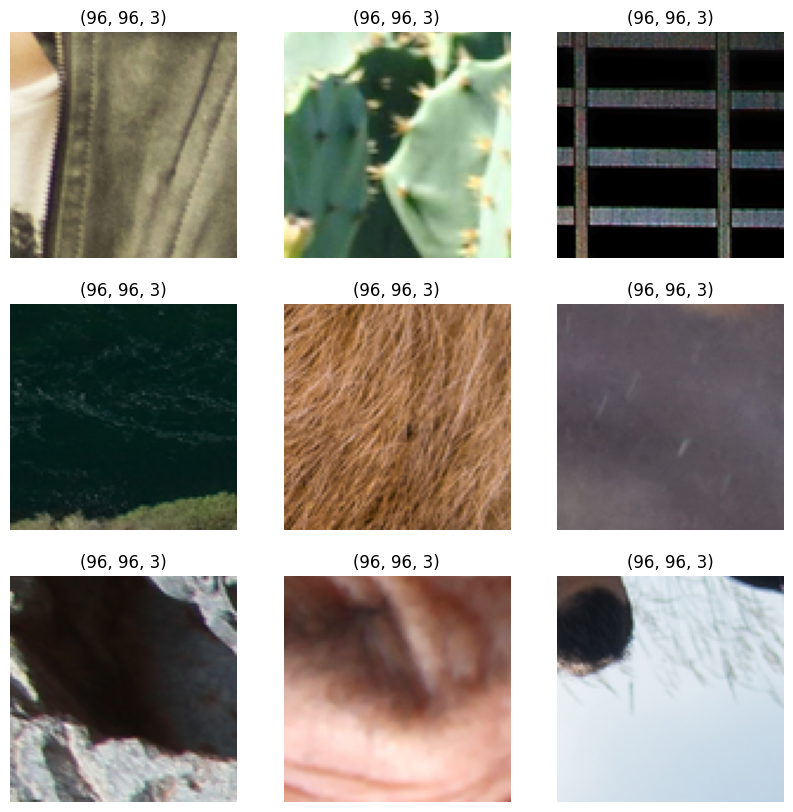

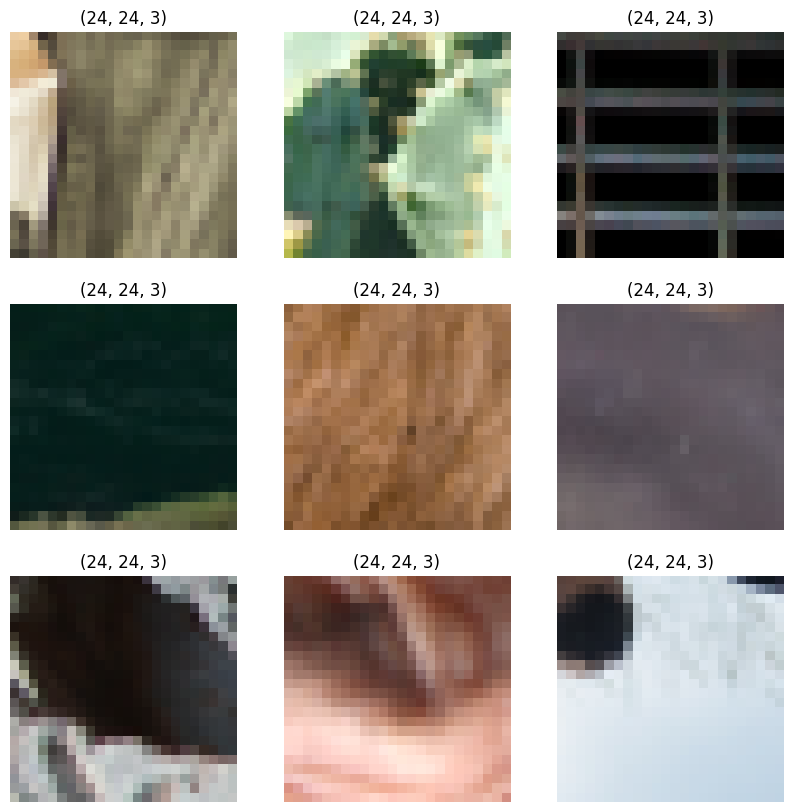

In [ ]:
lowres, highres = next(iter(train_ds))

# High Resolution Images
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(highres[i].numpy().astype("uint8"))
    plt.title(highres[i].shape)
    plt.axis("off")

# Low Resolution Images
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(lowres[i].numpy().astype("uint8"))
    plt.title(lowres[i].shape)
    plt.axis("off")


# Loss function (PSNR)


In [ ]:
def PSNR(super_resolution, high_resolution):
    """Compute the peak signal-to-noise ratio, measures quality of image."""
    # Max value of pixel is 255
    psnr_value = tf.image.psnr(high_resolution, super_resolution, max_val=255)[0]
    return psnr_value


## Build the model

In the paper, the authors train three models: EDSR, MDSR, and a baseline model. In this code example,
we only train the baseline model.

### Comparison with model with three residual blocks

The residual block design of EDSR differs from that of ResNet. Batch normalization
layers have been removed (together with the final ReLU activation): since batch normalization
layers normalize the features, they hurt output value range flexibility.
It is thus better to remove them. Further, it also helps reduce the
amount of GPU RAM required by the model, since the batch normalization layers consume the same amount of
memory as the preceding convolutional layers.

<img src="https://miro.medium.com/max/1050/1*EPviXGqlGWotVtV2gqVvNg.png" width="500" />

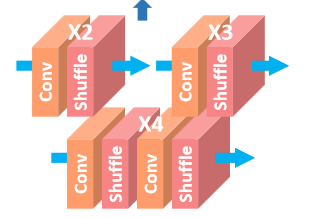

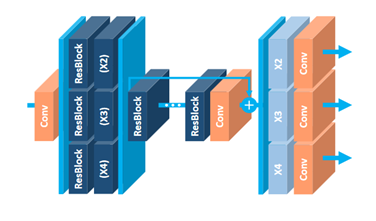

In [ ]:

class EDSRModel(tf.keras.Model):
    def train_step(self, data):
        # Unpack the data. Its structure depends on your model and
        # on what you pass to `fit()`.
        x, y = data

        with tf.GradientTape() as tape:
            y_pred = self(x, training=True)  # Forward pass
            # Compute the loss value
            # (the loss function is configured in `compile()`)
            loss = self.compiled_loss(y, y_pred, regularization_losses=self.losses)

        # Compute gradients
        trainable_vars = self.trainable_variables
        gradients = tape.gradient(loss, trainable_vars)
        # Update weights
        self.optimizer.apply_gradients(zip(gradients, trainable_vars))
        # Update metrics (includes the metric that tracks the loss)
        self.compiled_metrics.update_state(y, y_pred)
        # Return a dict mapping metric names to current value
        return {m.name: m.result() for m in self.metrics}

    def predict_step(self, x):
        # Adding dummy dimension using tf.expand_dims and converting to float32 using tf.cast
        x = tf.cast(tf.expand_dims(x, axis=0), tf.float32)
        # Passing low resolution image to model
        super_resolution_img = self(x, training=False)
        # Clips the tensor from min(0) to max(255)
        super_resolution_img = tf.clip_by_value(super_resolution_img, 0, 255)
        # Rounds the values of a tensor to the nearest integer
        super_resolution_img = tf.round(super_resolution_img)
        # Removes dimensions of size 1 from the shape of a tensor and converting to uint8
        super_resolution_img = tf.squeeze(
            tf.cast(super_resolution_img, tf.uint8), axis=0
        )
        return super_resolution_img


# Residual Block
def ResBlock(inputs):
    x = layers.Conv2D(64, 3, padding="same", activation="relu")(inputs)
    x = layers.Conv2D(64, 3, padding="same")(x)
    x = layers.Add()([inputs, x])
    return x

class MyLayer(layers.Layer):
    def call(self, x):
        return tf.nn.depth_to_space(x, block_size=2)

# Upsampling Block
def Upsampling(inputs, factor=2, **kwargs):
    x = layers.Conv2D(64 * (factor ** 2), 3, padding="same", **kwargs)(inputs)
    x = MyLayer()(x)
    x = layers.Conv2D(64 * (factor ** 2), 3, padding="same", **kwargs)(x)
    x = MyLayer()(x)
    return x

def make_model(num_filters, num_of_residual_blocks):
    # Flexible Inputs to input_layer
    input_layer = layers.Input(shape=(None, None, 3))
    # Scaling Pixel Values
    x = layers.Rescaling(scale=1.0 / 255)(input_layer)
    x = x_new = layers.Conv2D(num_filters, 3, padding="same")(x)

    # 16 residual blocks
    for _ in range(num_of_residual_blocks):
        x_new = ResBlock(x_new)

    x_new = layers.Conv2D(num_filters, 3, padding="same")(x_new)
    x = layers.Add()([x, x_new])

    x = Upsampling(x)
    x = layers.Conv2D(3, 3, padding="same")(x)

    output_layer = layers.Rescaling(scale=255)(x)
    return EDSRModel(input_layer, output_layer)



model = make_model(num_filters=64, num_of_residual_blocks=16)

## Train the model

In [ ]:
# Using adam optimizer with initial learning rate as 1e-4, changing learning rate after 5000 steps to 5e-5
optim_edsr = keras.optimizers.Adam(
    learning_rate=keras.optimizers.schedules.PiecewiseConstantDecay(
        boundaries=[5000], values=[1e-4, 5e-5]
    )
)
# Compiling model with loss as mean absolute error(L1 Loss) and metric as psnr
model.compile(optimizer=optim_edsr, loss="mae", metrics=[PSNR])
# Training for more epochs will improve results
model.fit(train_ds, epochs=100, steps_per_epoch=200, validation_data=val_ds)

Epoch 1/100


/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py:607: UserWarning: `model.compiled_loss()` is deprecated. Instead, use `model.compute_loss(x, y, y_pred, sample_weight, training)`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py:582: UserWarning: `model.compiled_metrics()` is deprecated. Instead, use e.g.:
```
for metric in self.metrics:
    metric.update_state(y, y_pred)
```

  return self._compiled_metrics_update_state(


200/200 ━━━━━━━━━━━━━━━━━━━━ 98s 356ms/step - psnr: 7.5495 - loss: 94.5908 - val_loss: 12.8944 - val_psnr: 8.6996
Epoch 2/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - psnr: 7.6837 - loss: 107.7681 - val_loss: 11.8807 - val_psnr: 6.2705
Epoch 3/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - psnr: 8.2210 - loss: 109.0648 - val_loss: 9.7310 - val_psnr: 6.8455
Epoch 4/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - psnr: 7.9100 - loss: 107.3062 - val_loss: 9.3196 - val_psnr: 7.4738
Epoch 5/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - psnr: 7.8607 - loss: 108.4532 - val_loss: 8.5564 - val_psnr: 6.2482
Epoch 6/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - psnr: 8.0007 - loss: 109.0680 - val_loss: 8.8681 - val_psnr: 6.3903
Epoch 7/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - psnr: 8.4034 - loss: 109.5187 - val_loss: 8.7171 - val_psnr: 7.7132
Epoch 8/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - psnr: 8.6498 - loss: 109.9798 - val_loss: 7.4123 - val_psnr: 7.7370
Epoch 9/100
200/2

#Save trained model to Google Drive

In [ ]:
model_path = os.path.join('/content/drive/MyDrive/EPITA2024/', 'Models')
model_filename = os.path.join(model_path, 'psnr_100epochs.keras')
model.save(model_filename)


# Load the model from Google Drive

In [ ]:
model_path = os.path.join('/content/drive/MyDrive/EPITA2024/', 'Models')
model_filename = os.path.join(model_path, 'psnr_100epochs.keras')
loaded_model = load_model(model_filename, custom_objects={'PSNR': PSNR, 'EDSRModel': EDSRModel, 'MyLayer': MyLayer })

## Run inference on new images and plot the results

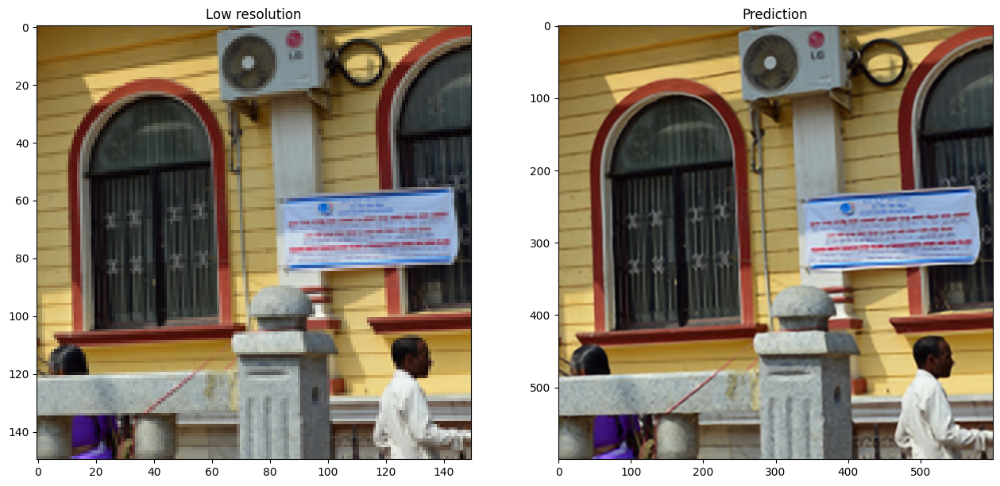

hi


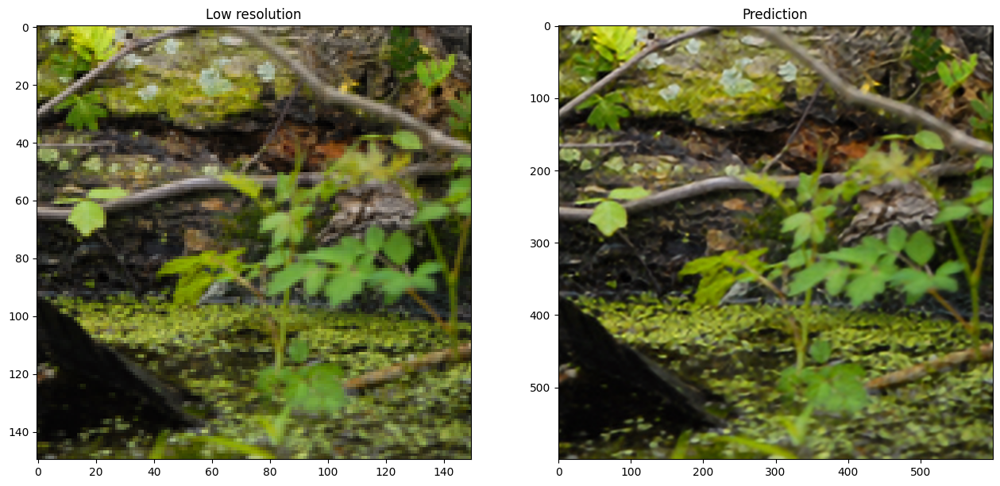

hi


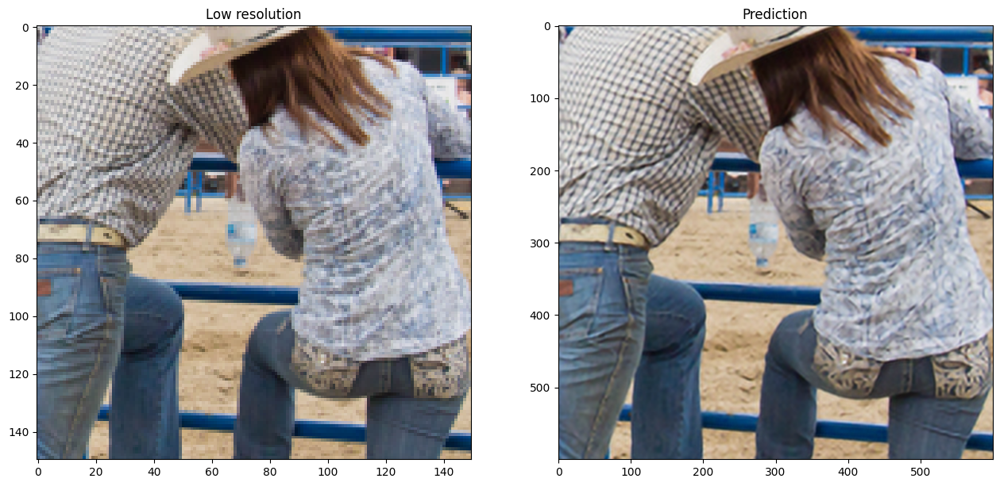

hi


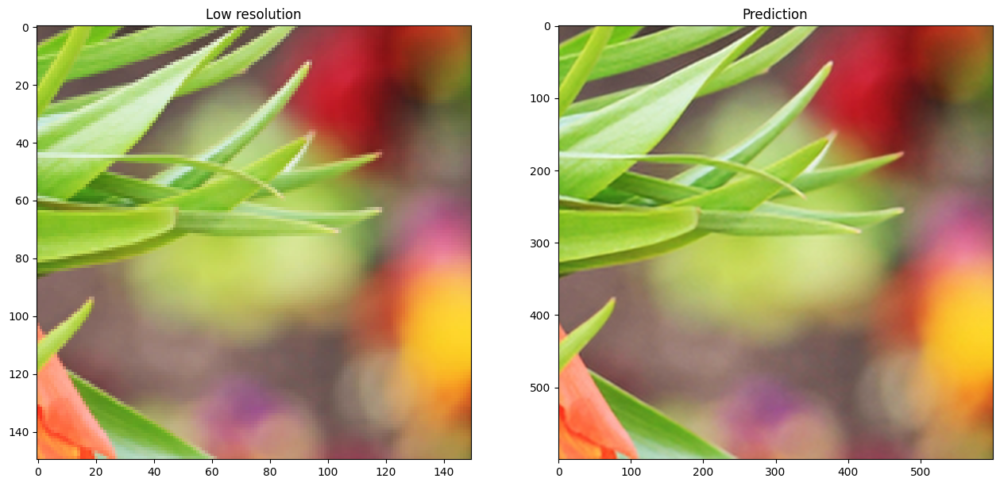

hi


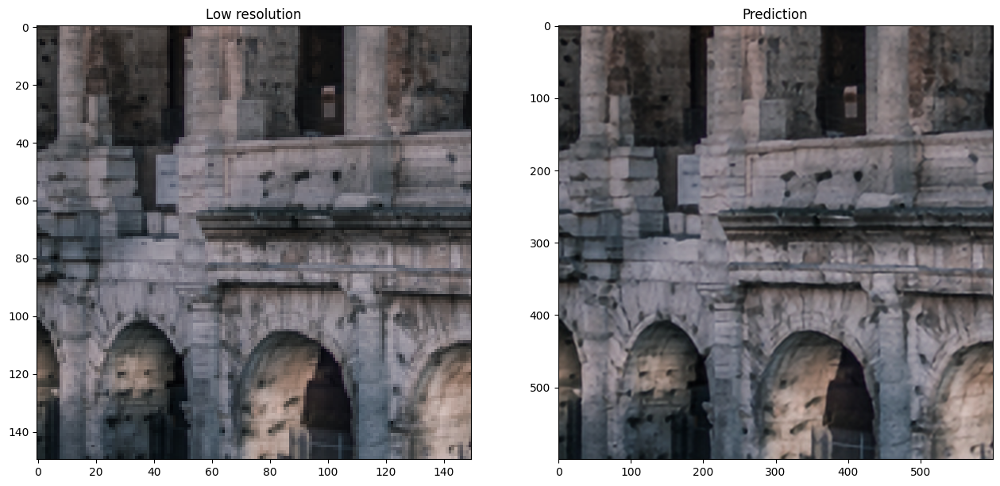

hi


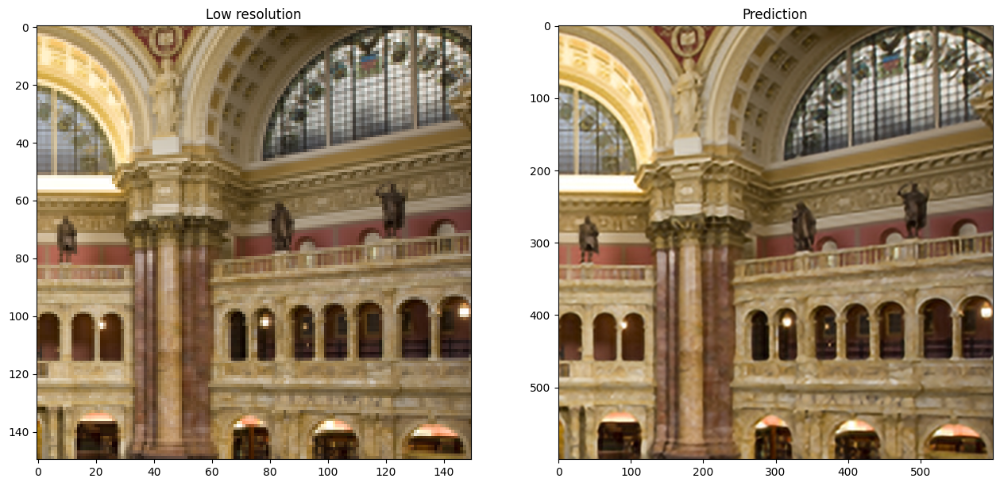

hi


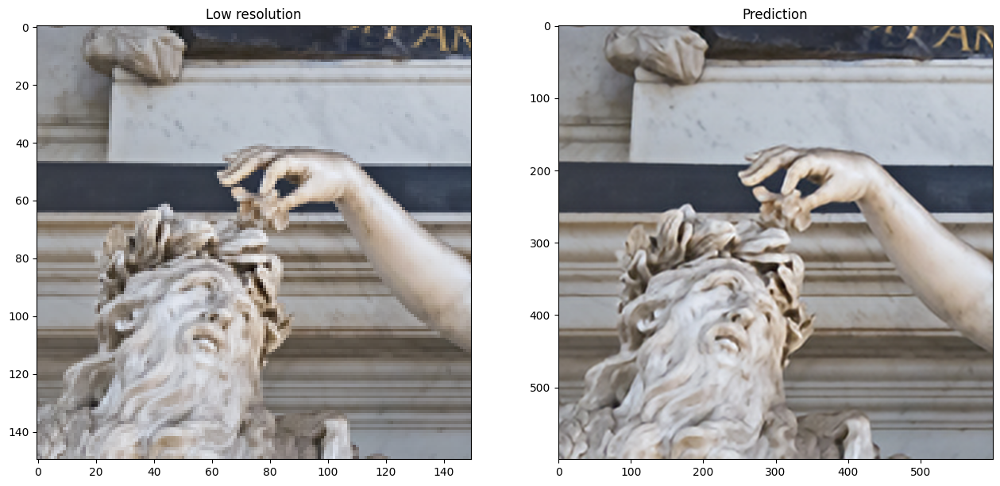

hi


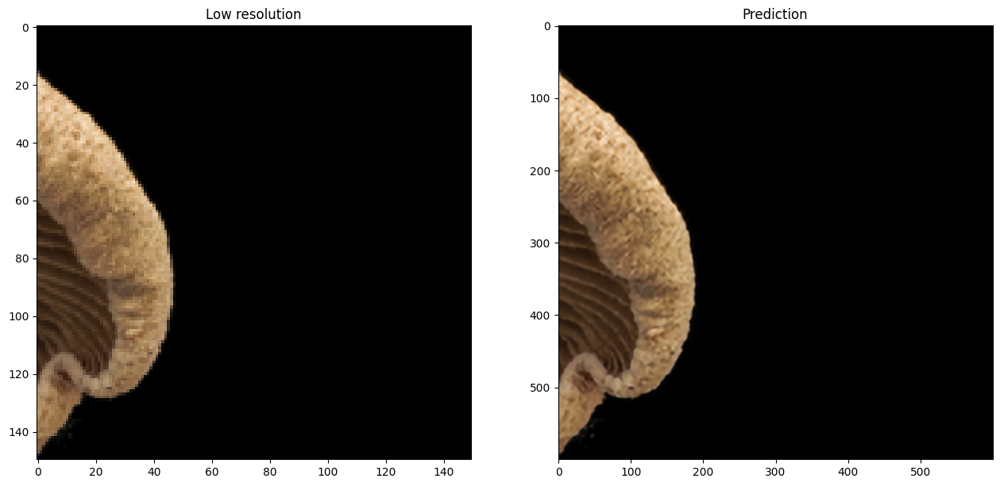

hi


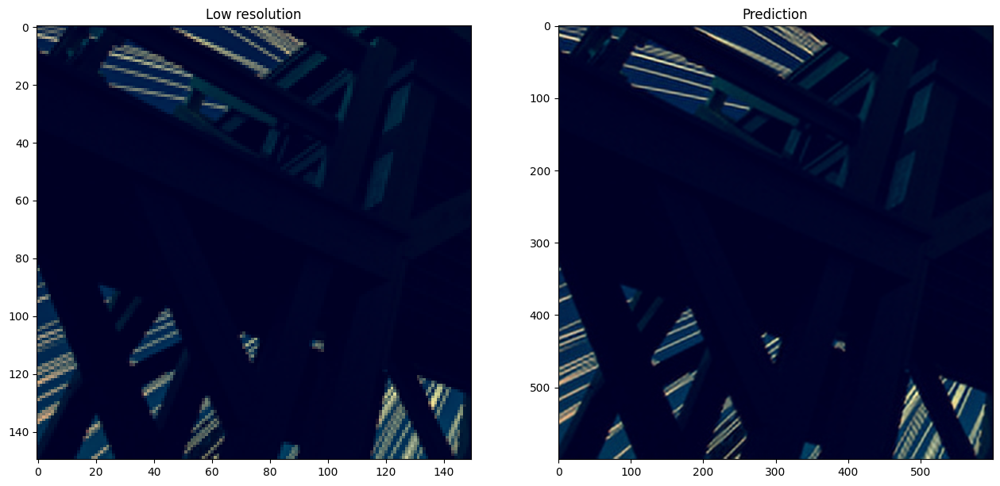

hi


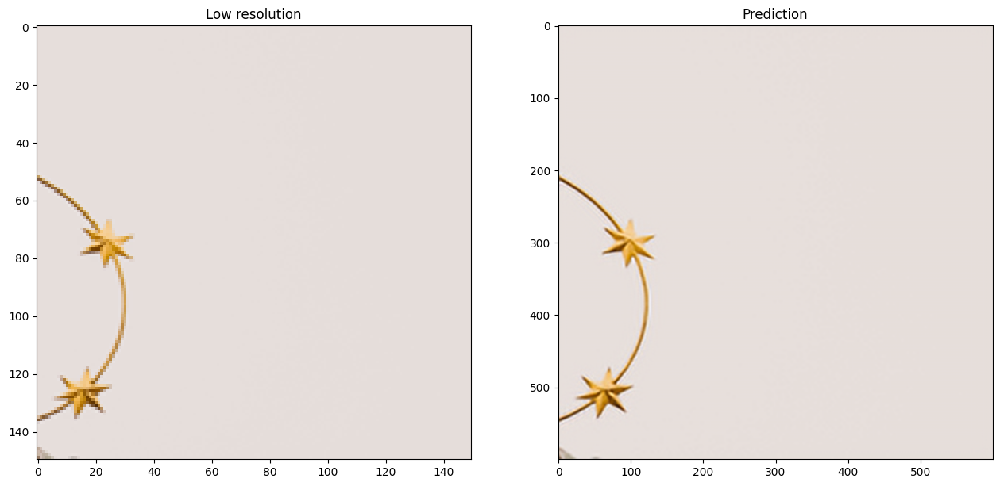

hi


In [ ]:

def plot_results(lowres, preds):
    """
    Displays low resolution image and super resolution image
    """
    plt.figure(figsize=(24, 14))
    plt.subplot(132), plt.imshow(lowres), plt.title("Low resolution")
    plt.subplot(133), plt.imshow(preds), plt.title("Prediction")
    plt.show()


for lowres, highres in val.take(10):
    lowres = tf.image.random_crop(lowres, (150, 150, 3))
    preds = loaded_model.predict_step(lowres)
    plot_results(lowres, preds)
    print('hi')

##New PSNR from Wikipedia

In [ ]:
def PSNR_wiki(super_resolution, high_resolution):
    super_resolution = tf.cast(super_resolution, tf.float32)
    high_resolution = tf.cast(high_resolution, tf.float32)
    #Calculate the MSE
    mse = tf.reduce_mean(tf.square(high_resolution - super_resolution))
    #Max pixel value
    max = 255.0
    #PSNR formula
    psnr = (20 * tf.math.log(max)) - (10 * tf.math.log(mse))
    return psnr

Now, i choosed an image that i downsampled to 1000x1000 to 250x250 (because the EDSR is x4) and we will test the difference between the predicted and the image using the PSNR_wiki

8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step
PSNR result between the predicted and true image : 51.3527717590332


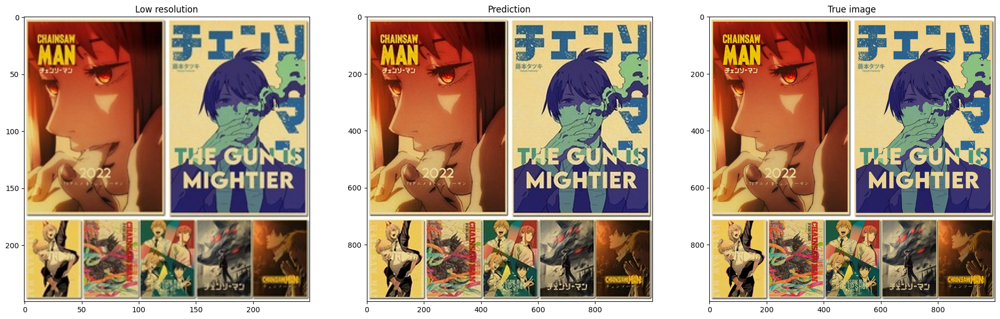

In [ ]:
from PIL import Image

#get img
lowres = '/content/drive/MyDrive/EPITA2024/source/img_PSNR_250x250.jpeg'
highres = '/content/drive/MyDrive/EPITA2024/source/img_PSNR_1000x1000.jpeg'

#load model
model_path = os.path.join('/content/drive/MyDrive/EPITA2024/', 'Models')
model_filename = os.path.join(model_path, 'psnr_100epochs.keras')
loaded_model = load_model(model_filename, custom_objects={'PSNR': PSNR, 'EDSRModel': EDSRModel, 'MyLayer': MyLayer })

img = Image.open(lowres)
img2 = Image.open(highres)
#change to array
img = np.array(img).astype(np.float32)
img2 = np.array(img2).astype(np.float32)


#We predict the super resolution
pred = loaded_model.predict(img)

#Calculate the new psnr
psnr = PSNR_wiki(pred, img2)
print(f"PSNR result between the predicted and true image : {psnr.numpy()}")


#convert to uint8 to plot
img_uint8 = img.astype(np.uint8)
img2_uint8 = (img2).astype(np.uint8)


plt.figure(figsize=(24, 14))
plt.subplot(1, 3, 1)
plt.imshow(img_uint8)
plt.title('Low resolution')
plt.subplot(1, 3, 2)
plt.imshow(pred)
plt.title('Prediction')
plt.subplot(1, 3, 3)
plt.imshow(img2_uint8)
plt.title('True image')
plt.show()

We can see, especially on the bellow of the image, that the predicted version is well predicted but not excellent. There is clearly a difference between the predicted and the true image.

##Impact of numEpochs on PSNR

Now, we will try different values of number of epochs and see the best results

10 epochs...
Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py:607: UserWarning: `model.compiled_loss()` is deprecated. Instead, use `model.compute_loss(x, y, y_pred, sample_weight, training)`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py:582: UserWarning: `model.compiled_metrics()` is deprecated. Instead, use e.g.:
```
for metric in self.metrics:
    metric.update_state(y, y_pred)
```

  return self._compiled_metrics_update_state(


200/200 ━━━━━━━━━━━━━━━━━━━━ 34s 99ms/step - psnr_wiki: 31.0291 - loss: 81.1313 - val_loss: 15.8471 - val_psnr_wiki: 48.0263
Epoch 2/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - psnr_wiki: 48.0071 - loss: 94.0976 - val_loss: 11.8712 - val_psnr_wiki: 52.5178
Epoch 3/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - psnr_wiki: 51.1525 - loss: 97.3272 - val_loss: 11.9602 - val_psnr_wiki: 53.8573
Epoch 4/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - psnr_wiki: 51.9262 - loss: 96.0302 - val_loss: 9.6108 - val_psnr_wiki: 56.3651
Epoch 5/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - psnr_wiki: 53.1939 - loss: 95.6644 - val_loss: 12.2645 - val_psnr_wiki: 54.6606
Epoch 6/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - psnr_wiki: 53.7405 - loss: 94.2277 - val_loss: 9.7000 - val_psnr_wiki: 56.2236
Epoch 7/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - psnr_wiki: 53.7650 - loss: 94.8797 - val_loss: 8.8584 - val_psnr_wiki: 56.6738
Epoch 8/10
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - psnr_wiki: 54

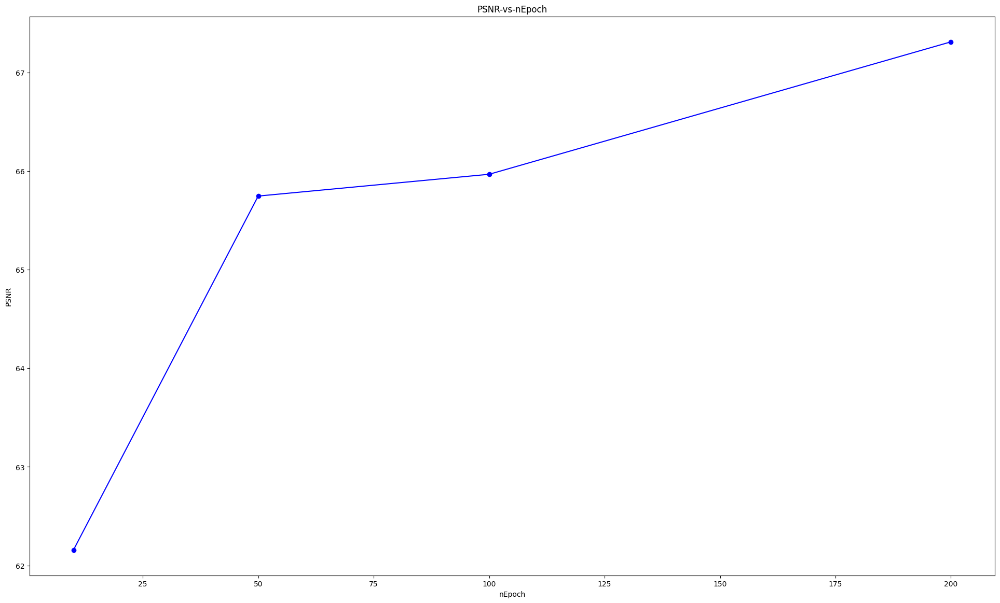

In [ ]:
epo = [10, 50, 100, 200]
res = []

for nEpochs in epo:

    print(f"{nEpochs} epochs...")
    model = make_model(num_filters=64, num_of_residual_blocks=16)

    # Using adam optimizer with initial learning rate as 1e-4, changing learning rate after 5000 steps to 5e-5
    optim_edsr = keras.optimizers.Adam(
        learning_rate=keras.optimizers.schedules.PiecewiseConstantDecay(
            boundaries=[5000], values=[1e-4, 5e-5]
        )
    )

    # Compiling model with loss as mean absolute error(L1 Loss) and metric as psnr
    model.compile(optimizer=optim_edsr, loss="mae", metrics=[PSNR_wiki])
    # Training for more epochs will improve results
    model.fit(train_ds, epochs=nEpochs, steps_per_epoch=200, validation_data=val_ds)

    psnr_values = []
    for lowres, highres in val.take(5):
        predi = model.predict(lowres)
        psnr = PSNR_wiki(predi, highres)
        psnr_values.append(psnr)

    mean = sum(psnr_values) / len(psnr_values)
    res.append(mean)
    print(f"PSNR after {nEpochs} epochs: {mean}")


plt.figure(figsize=(24, 14))
plt.plot(epo, res, marker='o', linestyle='-', color='b')
plt.title('PSNR-vs-nEpoch')
plt.xlabel('nEpoch')
plt.ylabel('PSNR')
plt.show()

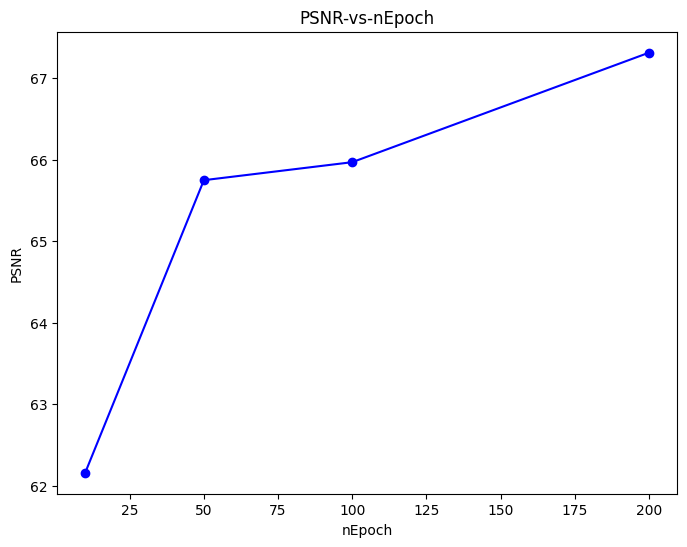

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(epo, res, marker='o', linestyle='-', color='b')
plt.title('PSNR-vs-nEpoch')
plt.xlabel('nEpoch')
plt.ylabel('PSNR')
plt.show()

As we can see, more we train, more the PSNR is better. But we can ask ourselves : it is wise to have training twice as big and twice as long to have a PSNR of 67 instead of 66 ?
Here, we are asked to use the better result for next tasks, so we will use 200 epochs.

##Impact of loss function on PSNR

Now, we will try differents loss functions and see the best result. Here, i tryed 3 loss functions :

SSIM loss function :
Measures the quality of 2 images watching the differences in contrasts, luminances,...


In [ ]:
def ssim_loss(super_resolution, high_resolution):
    return 1 - tf.reduce_mean(tf.image.ssim(high_resolution, super_resolution, max_val=255.0))

Charbonnier loss function : Use for Super Resolution and a better version than MAE

In [ ]:
def charbonnier_loss(super_resolution, high_resolution, epsilon=1e-3):
    return tf.reduce_mean(tf.sqrt(tf.square(high_resolution - super_resolution) + epsilon**2))

In [ ]:
loss = ["MAE", "SSIM", "Charbonnier", "MSE"]
res2 = []

#MAE loss function
print("MAE loss function :")
model2 = make_model(num_filters=64, num_of_residual_blocks=16)

# Using adam optimizer with initial learning rate as 1e-4, changing learning rate after 5000 steps to 5e-5
optim_edsr = keras.optimizers.Adam(
    learning_rate=keras.optimizers.schedules.PiecewiseConstantDecay(
        boundaries=[5000], values=[1e-4, 5e-5]
    )
)
# Compiling model with loss as mean absolute error(L1 Loss) and metric as psnr
model2.compile(optimizer=optim_edsr, loss="mae", metrics=[PSNR])
# Training for more epochs will improve results
model2.fit(train_ds, epochs=200, steps_per_epoch=200, validation_data=val_ds)

psnr_values = []
for lowres, highres in val.take(5):
    predi = model2.predict(lowres)
    psnr = PSNR_wiki(predi, highres)
    psnr_values.append(psnr)

mean = sum(psnr_values) / len(psnr_values)
res2.append(mean)

MAE loss function :
Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py:607: UserWarning: `model.compiled_loss()` is deprecated. Instead, use `model.compute_loss(x, y, y_pred, sample_weight, training)`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/keras/src/backend/tensorflow/trainer.py:582: UserWarning: `model.compiled_metrics()` is deprecated. Instead, use e.g.:
```
for metric in self.metrics:
    metric.update_state(y, y_pred)
```

  return self._compiled_metrics_update_state(


200/200 ━━━━━━━━━━━━━━━━━━━━ 28s 50ms/step - psnr: 7.7475 - loss: 82.6817 - val_loss: 15.3494 - val_psnr: 7.8826
Epoch 2/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - psnr: 8.4135 - loss: 96.7740 - val_loss: 11.1524 - val_psnr: 8.3644
Epoch 3/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - psnr: 7.3971 - loss: 95.3004 - val_loss: 10.0253 - val_psnr: 7.9759
Epoch 4/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - psnr: 8.7915 - loss: 95.6924 - val_loss: 9.8723 - val_psnr: 13.2163
Epoch 5/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - psnr: 8.0180 - loss: 95.5741 - val_loss: 9.7248 - val_psnr: 9.5980
Epoch 6/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - psnr: 8.6841 - loss: 94.4029 - val_loss: 8.8431 - val_psnr: 9.4193
Epoch 7/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - psnr: 9.0199 - loss: 95.5726 - val_loss: 8.6956 - val_psnr: 7.4142
Epoch 8/200
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - psnr: 9.2359 - loss: 95.8471 - val_loss: 7.8374 - val_psnr: 9.1396
Epoch 9/200
200/200 ━━━

In [ ]:
#SSIM loss function
print("SSIM loss function :")
model3 = make_model(num_filters=64, num_of_residual_blocks=16)

# Using adam optimizer with initial learning rate as 1e-4, changing learning rate after 5000 steps to 5e-5
optim_edsr = keras.optimizers.Adam(
    learning_rate=keras.optimizers.schedules.PiecewiseConstantDecay(
        boundaries=[5000], values=[1e-4, 5e-5]
    )
)

# Compiling model with loss as mean absolute error(L1 Loss) and metric as psnr
model3.compile(optimizer=optim_edsr, loss=ssim_loss, metrics=[PSNR_wiki])
# Training for more epochs will improve results
model3.fit(train_ds, epochs=150, steps_per_epoch=200, validation_data=val_ds)

psnr_values = []
for lowres, highres in val.take(5):
    predi = model3.predict(lowres)
    psnr = PSNR_wiki(predi, highres)
    psnr_values.append(psnr)

mean = sum(psnr_values) / len(psnr_values)
res2.append(mean)

SSIM loss function :
Epoch 1/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 25s 58ms/step - psnr_wiki: 28.7212 - loss: 72.3474 - val_loss: 0.3658 - val_psnr_wiki: 42.0151
Epoch 2/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - psnr_wiki: 44.2150 - loss: 89.3858 - val_loss: 0.2733 - val_psnr_wiki: 45.5842
Epoch 3/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - psnr_wiki: 46.6182 - loss: 88.8753 - val_loss: 0.2918 - val_psnr_wiki: 46.8371
Epoch 4/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - psnr_wiki: 47.5108 - loss: 91.3297 - val_loss: 0.2671 - val_psnr_wiki: 48.7122
Epoch 5/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - psnr_wiki: 47.1508 - loss: 93.5798 - val_loss: 0.2375 - val_psnr_wiki: 50.0091
Epoch 6/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - psnr_wiki: 48.0472 - loss: 92.6336 - val_loss: 0.2723 - val_psnr_wiki: 50.1470
Epoch 7/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - psnr_wiki: 49.1953 - loss: 92.8048 - val_loss: 0.2646 - val_psnr_wiki: 49.3934
Epoch 8/150
200/200 ━━━━━━━━━━━━━

In [ ]:
#Charbonnier loss function
print("Charbonnier loss function :")
model4 = make_model(num_filters=64, num_of_residual_blocks=16)

# Using adam optimizer with initial learning rate as 1e-4, changing learning rate after 5000 steps to 5e-5
optim_edsr = keras.optimizers.Adam(
    learning_rate=keras.optimizers.schedules.PiecewiseConstantDecay(
        boundaries=[5000], values=[1e-4, 5e-5]
    )
)

# Compiling model with loss as mean absolute error(L1 Loss) and metric as psnr
model4.compile(optimizer=optim_edsr, loss=charbonnier_loss, metrics=[PSNR_wiki])
# Training for more epochs will improve results
model4.fit(train_ds, epochs=150, steps_per_epoch=200, validation_data=val_ds)

psnr_values = []
for lowres, highres in val.take(5):
    predi = model4.predict(lowres)
    psnr = PSNR_wiki(predi, highres)
    psnr_values.append(psnr)

mean = sum(psnr_values) / len(psnr_values)
res2.append(mean)

Charbonnier loss function :
Epoch 1/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 23s 50ms/step - psnr_wiki: 29.5034 - loss: 79.7316 - val_loss: 17.3285 - val_psnr_wiki: 45.9877
Epoch 2/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - psnr_wiki: 46.4153 - loss: 93.0267 - val_loss: 13.4656 - val_psnr_wiki: 51.0353
Epoch 3/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - psnr_wiki: 49.9481 - loss: 97.3089 - val_loss: 11.2241 - val_psnr_wiki: 53.6195
Epoch 4/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - psnr_wiki: 51.7430 - loss: 95.9671 - val_loss: 11.1039 - val_psnr_wiki: 54.9366
Epoch 5/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - psnr_wiki: 52.2282 - loss: 97.6712 - val_loss: 9.1853 - val_psnr_wiki: 56.8833
Epoch 6/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - psnr_wiki: 52.8184 - loss: 94.2572 - val_loss: 8.6698 - val_psnr_wiki: 57.1238
Epoch 7/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - psnr_wiki: 53.4245 - loss: 98.4045 - val_loss: 9.9051 - val_psnr_wiki: 55.9180
Epoch 8/150
200/200 ━━

In [ ]:
#MSE loss function (the classic loss function)
print("MSE loss function :")
model5 = make_model(num_filters=64, num_of_residual_blocks=16)

# Using adam optimizer with initial learning rate as 1e-4, changing learning rate after 5000 steps to 5e-5
optim_edsr = keras.optimizers.Adam(
    learning_rate=keras.optimizers.schedules.PiecewiseConstantDecay(
        boundaries=[5000], values=[1e-4, 5e-5]
    )
)

# Compiling model with loss as mean absolute error(L1 Loss) and metric as psnr
model5.compile(optimizer=optim_edsr, loss="mse", metrics=[PSNR_wiki])
# Training for more epochs will improve results
model5.fit(train_ds, epochs=150, steps_per_epoch=200, validation_data=val_ds)

psnr_values = []
for lowres, highres in val.take(5):
    predi = model5.predict(lowres)
    psnr = PSNR_wiki(predi, highres)
    psnr_values.append(psnr)

mean = sum(psnr_values) / len(psnr_values)
res2.append(mean)

MSE loss function :
Epoch 1/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step - psnr_wiki: 29.5891 - loss: 76.2318 - val_loss: 906.7021 - val_psnr_wiki: 43.0384
Epoch 2/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - psnr_wiki: 44.3907 - loss: 94.5009 - val_loss: 524.3944 - val_psnr_wiki: 48.3961
Epoch 3/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - psnr_wiki: 47.8937 - loss: 95.8842 - val_loss: 458.0203 - val_psnr_wiki: 49.8431
Epoch 4/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - psnr_wiki: 49.2277 - loss: 96.6831 - val_loss: 369.8192 - val_psnr_wiki: 52.1829
Epoch 5/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - psnr_wiki: 50.5970 - loss: 96.9396 - val_loss: 351.9917 - val_psnr_wiki: 53.2020
Epoch 6/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - psnr_wiki: 51.4833 - loss: 94.2050 - val_loss: 301.7356 - val_psnr_wiki: 54.2751
Epoch 7/150
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - psnr_wiki: 52.9242 - loss: 95.9946 - val_loss: 304.8805 - val_psnr_wiki: 55.1255
Epoch 8/150
200/200 

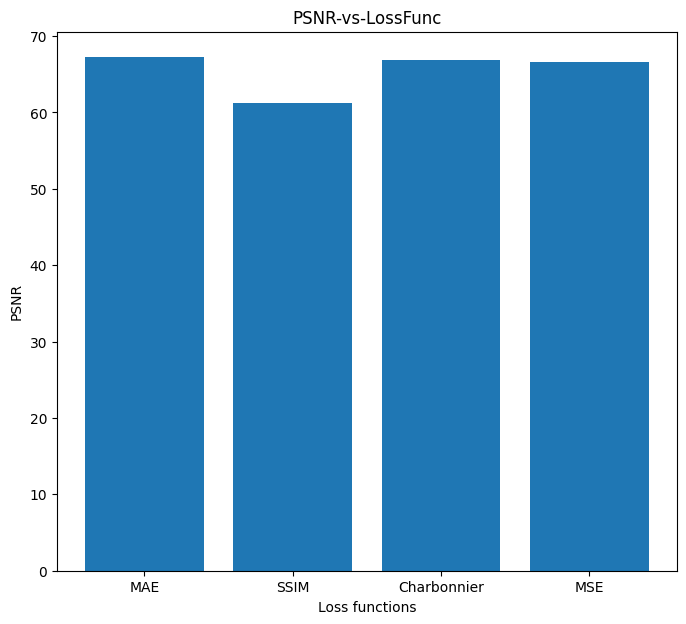

In [ ]:
plt.figure(figsize=(8, 7))
plt.bar(loss, res2)
plt.title('PSNR-vs-LossFunc')
plt.xlabel('Loss functions')
plt.ylabel('PSNR')
plt.show()

As we can see, the MAE, Charbonnier and MSE are almost equal in performance. The MAE is just slightly better than the 2 others. So we will use the MAE for the next tasks

##Super-Resolution on Video

Now, we will apply Super Resolution on 50 frames of a video, and we will re build the video to see the result

In [ ]:
from PIL import Image

img_path = os.path.join('/content/drive/MyDrive/EPITA2024/source/converted/PNGs/frame_')
save_path = os.path.join('/content/drive/MyDrive/EPITA2024/source/converted/PNGs_SR/frame_')
save_path2 = os.path.join('/content/drive/MyDrive/EPITA2024/source/converted/PNGs_SR')

if not os.path.exists(save_path2):
  os.mkdir(save_path2)

for i in range(0, 50):
    name = f"{i:04d}.png"
    path_ = img_path + name

    img = Image.open(path_)
    #change to array
    img = np.array(img).astype(np.float32)
    #We predict the super resolution
    pred = loaded_model.predict(img)
    #convert to uint8 to plot
    img_uint8 = pred.astype(np.uint8)

    sr_path = save_path + name
    Image.fromarray(img_uint8).save(sr_path)

8/8 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 14s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step
8/8 ━━━━━━━━━━━━━━━━━━━━ 13s 2s/step
8

##Analytic Task

Now, we will see on differents images how the EDSR work. We will try to know when the EDSR work well or not, and find why.

First, we will try on a image with a lot of colors, like a psychedelic image, to see if it can handle a lot of colors of different tones

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
PSNR result between the predicted and true image : 74.32492065429688


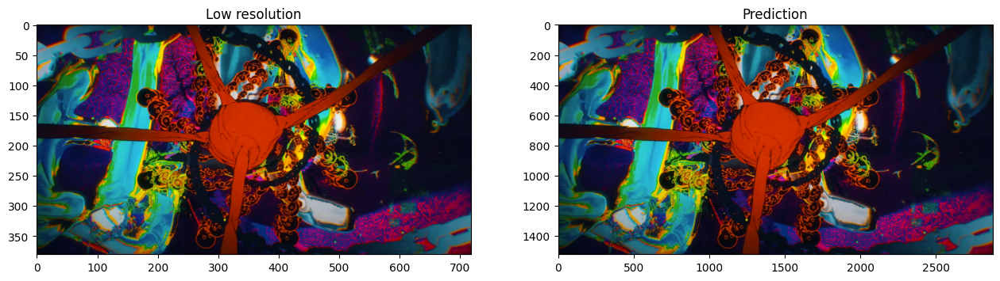

Text(0.5, 1.0, 'True image')

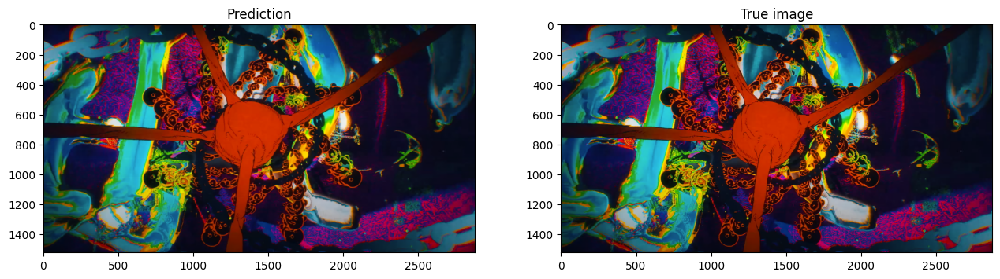

In [ ]:
from PIL import Image

#get img
lowres = '/content/drive/MyDrive/EPITA2024/source/first_lr.png'
highres = '/content/drive/MyDrive/EPITA2024/source/first_hr.png'

img = Image.open(lowres)
img2 = Image.open(highres)

img = img.convert('RGB')
img2 = img2.convert('RGB')
#change to array
img = np.array(img).astype(np.float32)
img2 = np.array(img2).astype(np.float32)


#We predict the super resolution
pred = model2.predict(img)

#Calculate the new psnr
psnr = PSNR_wiki(pred, img2)
print(f"PSNR result between the predicted and true image : {psnr.numpy()}")


#convert to uint8 to plot
img_uint8 = img.astype(np.uint8)
img2_uint8 = (img2).astype(np.uint8)


plt.figure(figsize=(24, 14))
plt.subplot(1, 3, 1)
plt.imshow(img_uint8)
plt.title('Low resolution')
plt.subplot(1, 3, 2)
plt.imshow(pred)
plt.title('Prediction')
plt.show()

plt.figure(figsize=(24, 14))
plt.subplot(1, 3, 1)
plt.imshow(pred)
plt.title('Prediction')
plt.subplot(1, 3, 2)
plt.imshow(img2_uint8)
plt.title('True image')

Here, we can't really see a big difference between the prediction and the reference, so the EDSR can really well handle an image with a lot of colors.

Now, we will try with a lots of fine lines, to see if he can follow

12/12 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step
PSNR result between the predicted and true image : 71.62789916992188


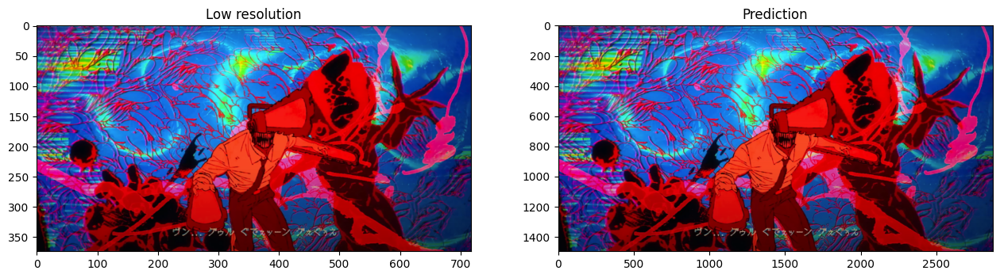

Text(0.5, 1.0, 'True image')

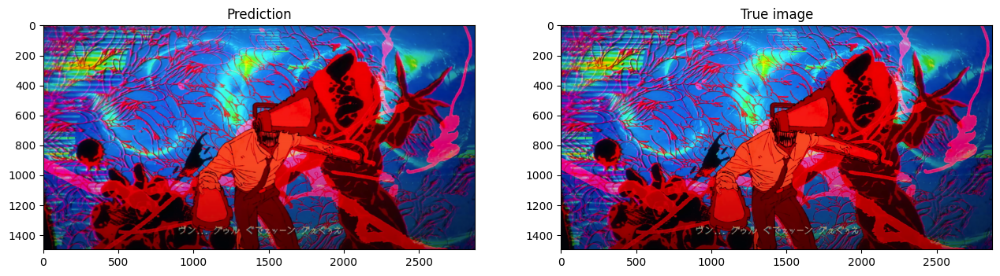

In [ ]:
from PIL import Image

#get img
lowres = '/content/drive/MyDrive/EPITA2024/source/second_lr.png'
highres = '/content/drive/MyDrive/EPITA2024/source/second_hr.png'

img = Image.open(lowres)
img2 = Image.open(highres)

img = img.convert('RGB')
img2 = img2.convert('RGB')
#change to array
img = np.array(img).astype(np.float32)
img2 = np.array(img2).astype(np.float32)


#We predict the super resolution
pred = model2.predict(img)

#Calculate the new psnr
psnr = PSNR_wiki(pred, img2)
print(f"PSNR result between the predicted and true image : {psnr.numpy()}")


#convert to uint8 to plot
img_uint8 = img.astype(np.uint8)
img2_uint8 = (img2).astype(np.uint8)


plt.figure(figsize=(24, 14))
plt.subplot(1, 3, 1)
plt.imshow(img_uint8)
plt.title('Low resolution')
plt.subplot(1, 3, 2)
plt.imshow(pred)
plt.title('Prediction')
plt.show()

plt.figure(figsize=(24, 14))
plt.subplot(1, 3, 1)
plt.imshow(pred)
plt.title('Prediction')
plt.subplot(1, 3, 2)
plt.imshow(img2_uint8)
plt.title('True image')

I thought the EDSR would have difficulty handling the red/pink lines, but in the end it predicted very well

Now we will test with monochrome image and with a lot of light effects on the image, which can be difficult for the EDSR

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
PSNR result between the predicted and true image : 73.35303497314453


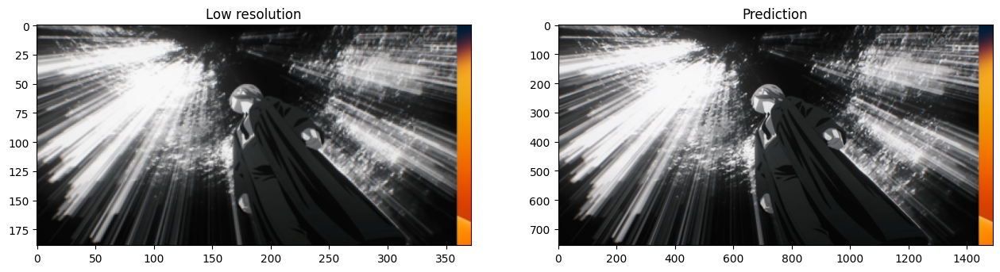

Text(0.5, 1.0, 'True image')

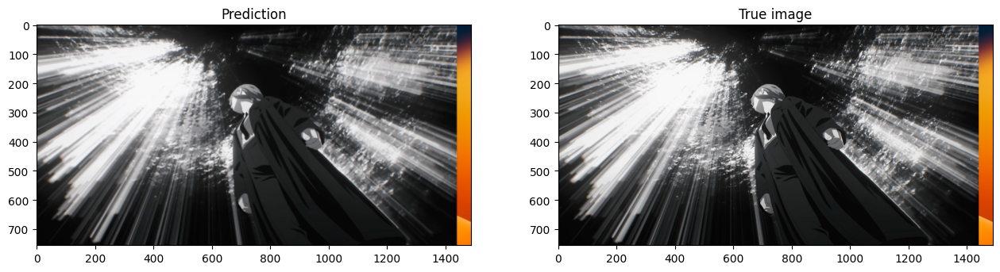

In [ ]:
from PIL import Image

#get img
lowres = '/content/drive/MyDrive/EPITA2024/source/third_lr.png'
highres = '/content/drive/MyDrive/EPITA2024/source/third_hr.png'

img = Image.open(lowres)
img2 = Image.open(highres)

img = img.convert('RGB')
img2 = img2.convert('RGB')
#change to array
img = np.array(img).astype(np.float32)
img2 = np.array(img2).astype(np.float32)


#We predict the super resolution
pred = model2.predict(img)

#Calculate the new psnr
psnr = PSNR_wiki(pred, img2)
print(f"PSNR result between the predicted and true image : {psnr.numpy()}")


#convert to uint8 to plot
img_uint8 = img.astype(np.uint8)
img2_uint8 = (img2).astype(np.uint8)


plt.figure(figsize=(24, 14))
plt.subplot(1, 3, 1)
plt.imshow(img_uint8)
plt.title('Low resolution')
plt.subplot(1, 3, 2)
plt.imshow(pred)
plt.title('Prediction')
plt.show()

plt.figure(figsize=(24, 14))
plt.subplot(1, 3, 1)
plt.imshow(pred)
plt.title('Prediction')
plt.subplot(1, 3, 2)
plt.imshow(img2_uint8)
plt.title('True image')

As we can see, the predicted image is more blurry than the real image. Even though the PSNR score is high (73), we can see the slightblurring on the whole image

Let's test with an image having very rough lines

6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
PSNR result between the predicted and true image : 70.00996398925781


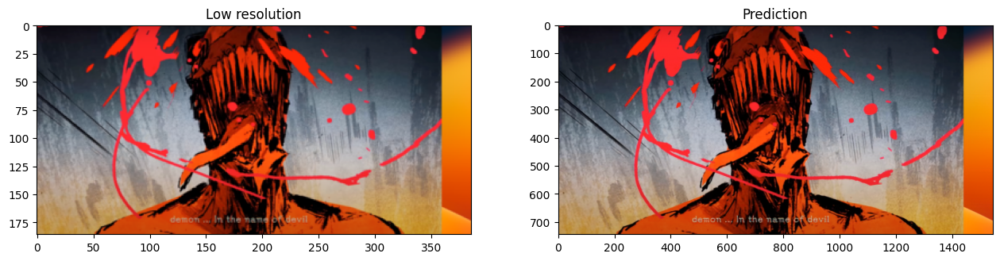

Text(0.5, 1.0, 'True image')

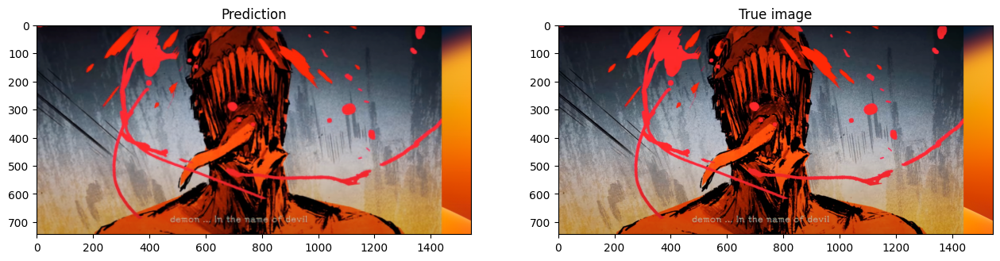

In [ ]:
from PIL import Image

#get img
lowres = '/content/drive/MyDrive/EPITA2024/source/fourth_lr.png'
highres = '/content/drive/MyDrive/EPITA2024/source/fourth_hr.png'

img = Image.open(lowres)
img2 = Image.open(highres)

img = img.convert('RGB')
img2 = img2.convert('RGB')
#change to array
img = np.array(img).astype(np.float32)
img2 = np.array(img2).astype(np.float32)


#We predict the super resolution
pred = model2.predict(img)

#Calculate the new psnr
psnr = PSNR_wiki(pred, img2)
print(f"PSNR result between the predicted and true image : {psnr.numpy()}")


#convert to uint8 to plot
img_uint8 = img.astype(np.uint8)
img2_uint8 = (img2).astype(np.uint8)


plt.figure(figsize=(24, 14))
plt.subplot(1, 3, 1)
plt.imshow(img_uint8)
plt.title('Low resolution')
plt.subplot(1, 3, 2)
plt.imshow(pred)
plt.title('Prediction')
plt.show()

plt.figure(figsize=(24, 14))
plt.subplot(1, 3, 1)
plt.imshow(pred)
plt.title('Prediction')
plt.subplot(1, 3, 2)
plt.imshow(img2_uint8)
plt.title('True image')

As we can see on tghe predicted image, he's not really good for raw draw lines like the black lines, it's less precise.

Let's try with a pixel art. For this, the EDSR should not work well because the whole image is represented by raw pixels variations and not in gradient as the EDSR trained.

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 269ms/step
PSNR result between the predicted and true image : 53.70820617675781


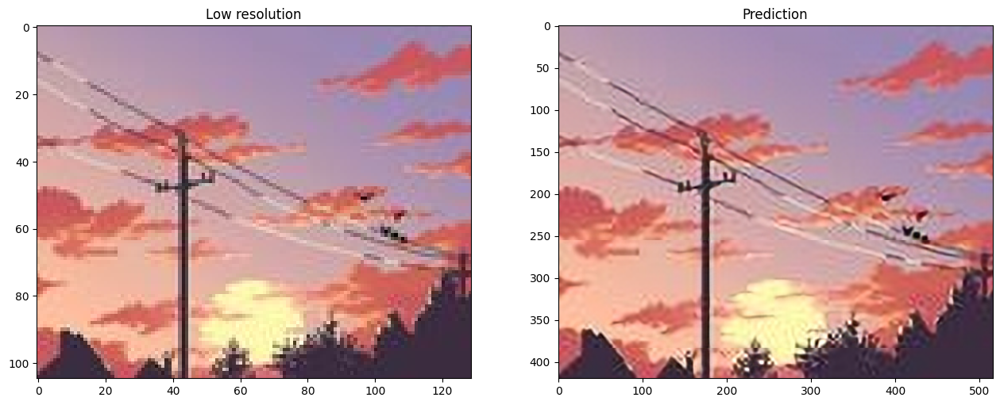

Text(0.5, 1.0, 'True image')

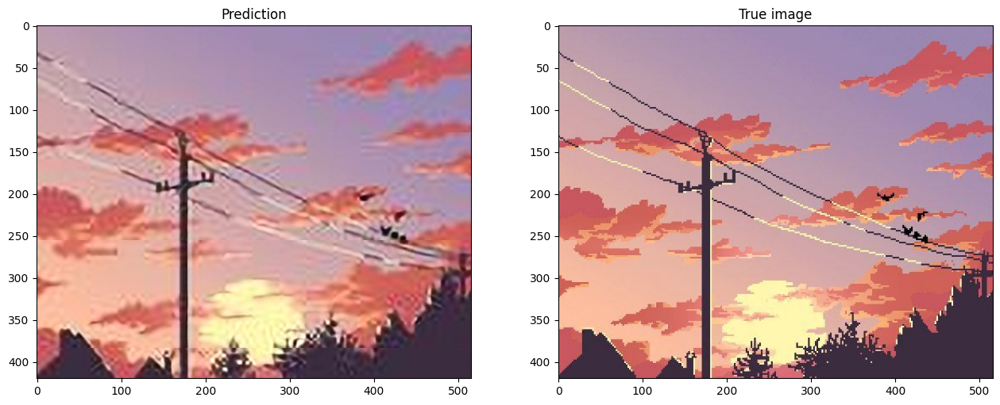

In [ ]:
from PIL import Image

#get img
lowres = '/content/drive/MyDrive/EPITA2024/source/pixelart_lr.jpg'
highres = '/content/drive/MyDrive/EPITA2024/source/pixelart_hr.jpg'

img = Image.open(lowres)
img2 = Image.open(highres)

img = img.convert('RGB')
img2 = img2.convert('RGB')
#change to array
img = np.array(img).astype(np.float32)
img2 = np.array(img2).astype(np.float32)


#We predict the super resolution
pred = model2.predict(img)

#Calculate the new psnr
psnr = PSNR_wiki(pred, img2)
print(f"PSNR result between the predicted and true image : {psnr.numpy()}")


#convert to uint8 to plot
img_uint8 = img.astype(np.uint8)
img2_uint8 = (img2).astype(np.uint8)


plt.figure(figsize=(24, 14))
plt.subplot(1, 3, 1)
plt.imshow(img_uint8)
plt.title('Low resolution')
plt.subplot(1, 3, 2)
plt.imshow(pred)
plt.title('Prediction')
plt.show()

plt.figure(figsize=(24, 14))
plt.subplot(1, 3, 1)
plt.imshow(pred)
plt.title('Prediction')
plt.subplot(1, 3, 2)
plt.imshow(img2_uint8)
plt.title('True image')

So as i said, he predicted wrongly by wanting to make color gradients instead of making direct color cuts

And now an ultra realistic image in 4K

27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 90ms/step
PSNR result between the predicted and true image : 51.682518005371094


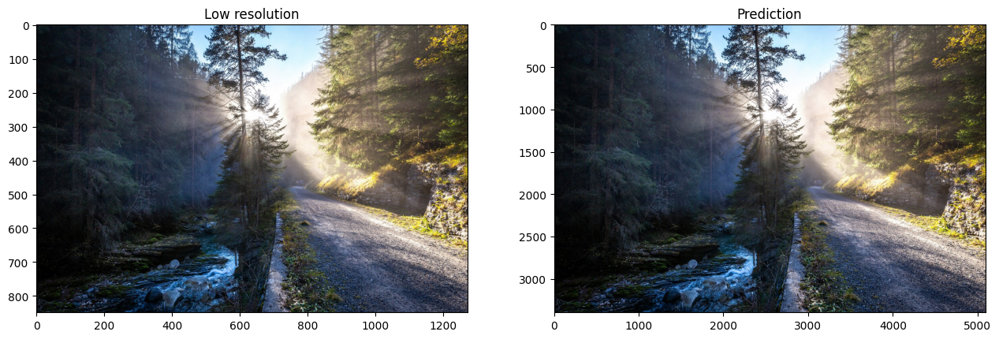

Text(0.5, 1.0, 'True image')

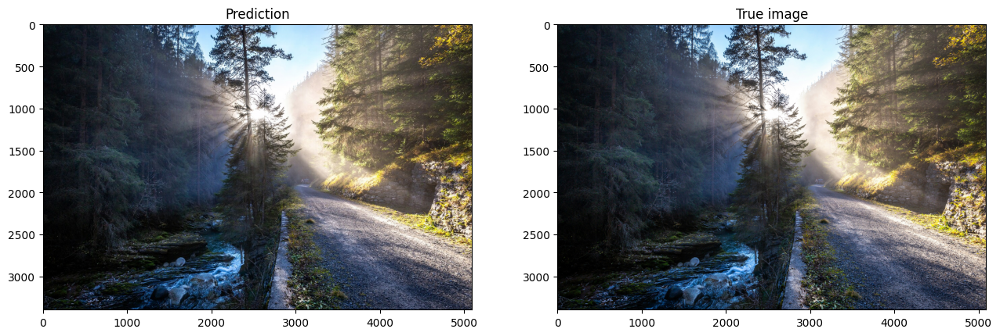

In [ ]:
from PIL import Image

#get img
lowres = '/content/drive/MyDrive/EPITA2024/source/ultra_realist_lr.jpg'
highres = '/content/drive/MyDrive/EPITA2024/source/ultra_realist_hr.jpg'

img = Image.open(lowres)
img2 = Image.open(highres)

img = img.convert('RGB')
img2 = img2.convert('RGB')
#change to array
img = np.array(img).astype(np.float32)
img2 = np.array(img2).astype(np.float32)


#We predict the super resolution
pred = model2.predict(img)

#Calculate the new psnr
psnr = PSNR_wiki(pred, img2)
print(f"PSNR result between the predicted and true image : {psnr.numpy()}")


#convert to uint8 to plot
img_uint8 = img.astype(np.uint8)
img2_uint8 = (img2).astype(np.uint8)


plt.figure(figsize=(24, 14))
plt.subplot(1, 3, 1)
plt.imshow(img_uint8)
plt.title('Low resolution')
plt.subplot(1, 3, 2)
plt.imshow(pred)
plt.title('Prediction')
plt.show()

plt.figure(figsize=(24, 14))
plt.subplot(1, 3, 1)
plt.imshow(pred)
plt.title('Prediction')
plt.subplot(1, 3, 2)
plt.imshow(img2_uint8)
plt.title('True image')

Here, the images are too high in quality (5000 x 3500) to be able to see the defaults on this plot. But the PSNR is at 51 (like the pixel art). So it means it not predicted very well. But why we can see a clearly difference ? Because there a lot more pixels than before, this means that he is more likely to be wrong, so the score is not good. But if we zoom on the images, we will see the differences.